# Imports

In [1]:
import numpy as np
from numpy import linalg as la
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import seaborn as sns

from sklearn.svm import SVC

import time

import os
import sys

from warnings import filterwarnings
filterwarnings('ignore')

# Use in VS Code
# from load_data import load_data

## Run only in Colab

In [2]:
# Only in Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Only in Colab
# Set the folder path to the root of the datasets in this folder.
folder_path = '/content/drive/MyDrive/folder/path/to/datasets'
assert os.path.exists(folder_path), "Root folder path does not exist"

In [4]:
# Run only in Colab

sys.path.append(folder_path)
from load_data import load_data

## Load the data

In [5]:
start_time = time.time()

dataset1_path = os.path.join(folder_path, "./dataset1.csv")
X_original, Y = load_data(dataset1_path)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time} seconds")

Elapsed Time: 4.7251317501068115 seconds


In [6]:
start_time = time.time()

blind_dataset1_path = os.path.join(folder_path, "./blind_test1.csv")
X_blind_original, _ = load_data(blind_dataset1_path)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time} seconds")

Y is None
Elapsed Time: 0.9945745468139648 seconds


## Convert Numpy array to Pandas DataFrame

In [7]:
X_df = pd.DataFrame(X_original)

Y_df = pd.DataFrame(Y)

X_blind_df = pd.DataFrame(X_blind_original)

In [10]:
X_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.994210,0.339437,0.0,0.481943,4.104690,0.0,0.0,1.003648,0.0,1.353046,...,2.507152,0.000000,3.588297,0.000000,0.000000,0.156997,3.890810,0.000000,0.000000,0.0
1,0.000000,1.415991,0.0,2.885742,0.000000,0.0,0.0,0.000000,0.0,0.000000,...,0.211144,0.000000,3.315986,0.965814,3.044368,3.456200,0.000000,9.485678,0.028253,0.0
2,0.000000,1.320484,0.0,2.814479,0.832429,0.0,0.0,0.000000,0.0,0.000000,...,0.000000,0.000000,3.118805,0.399551,2.272334,2.339240,0.000000,7.692220,0.000000,0.0
3,0.459657,1.202142,0.0,0.000000,2.281308,0.0,0.0,1.488012,0.0,0.808162,...,3.554601,0.996622,2.015630,0.000000,2.926057,0.000000,1.943083,3.075836,0.000000,0.0
4,0.023708,0.000000,0.0,1.006909,0.000000,0.0,0.0,1.312168,0.0,1.016113,...,1.661898,0.000000,10.896092,1.081312,6.260812,4.976063,6.542039,1.703158,0.000000,0.0


In [11]:
X_blind_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.433888,0.584314,0.0,2.060552,2.945309,0.0,0.369958,2.949629,0.0,1.648048,...,3.010407,0.406688,1.360133,0.000000,2.449337,0.000000,0.764747,0.000000,0.0,0.0
1,0.000000,3.600694,0.0,0.858300,0.967494,0.0,0.000000,3.073008,0.0,0.000000,...,0.311528,0.000000,8.238040,1.033474,2.611662,1.917893,5.071940,4.870718,0.0,0.0
2,0.000000,3.472290,0.0,1.457396,1.032517,0.0,0.000000,3.134619,0.0,0.000000,...,0.054966,0.000000,6.244536,0.803233,2.717448,1.502867,4.175643,4.662583,0.0,0.0
3,0.000000,1.591720,0.0,3.381381,3.537153,0.0,0.000000,2.946058,0.0,0.000000,...,0.000000,0.000000,1.126994,0.000000,3.449582,0.301905,2.213734,3.914564,0.0,0.0
4,1.217804,0.037316,0.0,0.770278,4.479984,0.0,0.000000,0.734885,0.0,1.228074,...,2.362442,0.000000,4.044020,0.113741,0.122593,0.169172,5.096256,0.000000,0.0,0.0


In [12]:
X_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,0.378181,1.317949,0.009003,1.391512,1.814728,0.011052,0.369846,1.626467,0.014639,0.545710,...,2.272932,0.296990,3.042890,0.339678,2.625464,0.842655,1.926343,2.506435,0.035964,0.009226
std,0.516047,1.496512,0.050664,1.230377,1.508633,0.050906,0.630221,1.112125,0.062849,0.557098,...,2.104927,0.495357,2.883971,0.446056,1.673630,1.331757,2.016545,2.694744,0.134504,0.057310
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.248946,0.000000,0.409221,0.463299,0.000000,0.000000,0.603037,0.000000,0.000000,...,0.483817,0.000000,0.683260,0.000000,1.323167,0.000000,0.020918,0.108381,0.000000,0.000000
50%,0.075048,0.910430,0.000000,1.076016,1.624676,0.000000,0.000000,1.722971,0.000000,0.410361,...,1.973584,0.000000,2.138780,0.023752,2.541312,0.036439,1.263868,1.690138,0.000000,0.000000
75%,0.608842,1.645869,0.000000,2.084849,2.857240,0.000000,0.562436,2.507033,0.000000,1.017619,...,3.381041,0.460844,4.736313,0.722400,3.915264,0.973730,3.399809,3.824580,0.000000,0.000000
max,3.206600,8.212224,0.748968,6.523547,6.554948,0.658043,3.620714,4.950512,0.839790,2.649603,...,12.077601,2.320764,13.996863,2.380158,8.275156,6.449932,8.829996,13.680472,1.375294,1.057508


In [13]:
X_blind_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.371903,1.290253,0.009115,1.396846,1.830216,0.010462,0.354332,1.615608,0.014489,0.546114,...,2.229352,0.292754,3.048722,0.330959,2.592000,0.844586,1.941248,2.493135,0.033515,0.008127
std,0.509466,1.480494,0.051749,1.206766,1.491688,0.050339,0.611197,1.095775,0.063313,0.549835,...,2.062532,0.486647,2.846174,0.443211,1.651005,1.323865,1.985435,2.673338,0.132592,0.055139
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.229160,0.000000,0.443358,0.488734,0.000000,0.000000,0.638269,0.000000,0.000000,...,0.473890,0.000000,0.745337,0.000000,1.309943,0.000000,0.070376,0.148131,0.000000,0.000000
50%,0.057141,0.882379,0.000000,1.105087,1.675764,0.000000,0.000000,1.675463,0.000000,0.421687,...,1.940213,0.000000,2.192284,0.004386,2.498253,0.054994,1.339522,1.689639,0.000000,0.000000
75%,0.619030,1.616386,0.000000,2.058674,2.835237,0.000000,0.533029,2.474927,0.000000,1.012854,...,3.310865,0.453145,4.681890,0.702819,3.832808,1.002640,3.310388,3.793412,0.000000,0.000000
max,3.160051,7.984558,0.658491,5.927709,6.844651,0.622780,3.346777,4.707161,0.829520,2.390183,...,11.403351,2.244202,13.847556,1.923470,7.687513,6.308266,8.464344,12.968296,1.229173,0.812376


## Check non numeric values

In [19]:
# Count the number of NaN values in each column
X_nan_counts = X_df.isna().sum(axis=0) # shape (ncols,)
X_blind_nan_counts = X_df.isna().sum(axis=0)

# Count the number of null values in each column
X_null_counts = X_df.isnull().sum(axis=0)
X_blind_null_counts = X_df.isnull().sum(axis=0)

print(f"X_nan_counts: {X_nan_counts.sum()} \tX_blind_nan_counts: {X_blind_nan_counts.sum()}")
print(f"X_null_counts: {X_null_counts.sum()} \tX_blind_null_counts: {X_blind_null_counts.sum()}")



X_nan_counts: 0 	X_blind_nan_counts: 0
X_null_counts: 0 	X_blind_null_counts: 0


In [ ]:
# Check for non-numeric values
# This will create a DataFrame where each element is True if the corresponding element in the
# original DataFrame is non-numeric, and False otherwise.
# non_numeric_check = X_df.applymap(lambda x: not pd.api.types.is_numeric_dtype(x))

# print( non_numeric_check.sum().sum() )
# non_numeric_check.iloc[:2,:5]


## Data Visualization

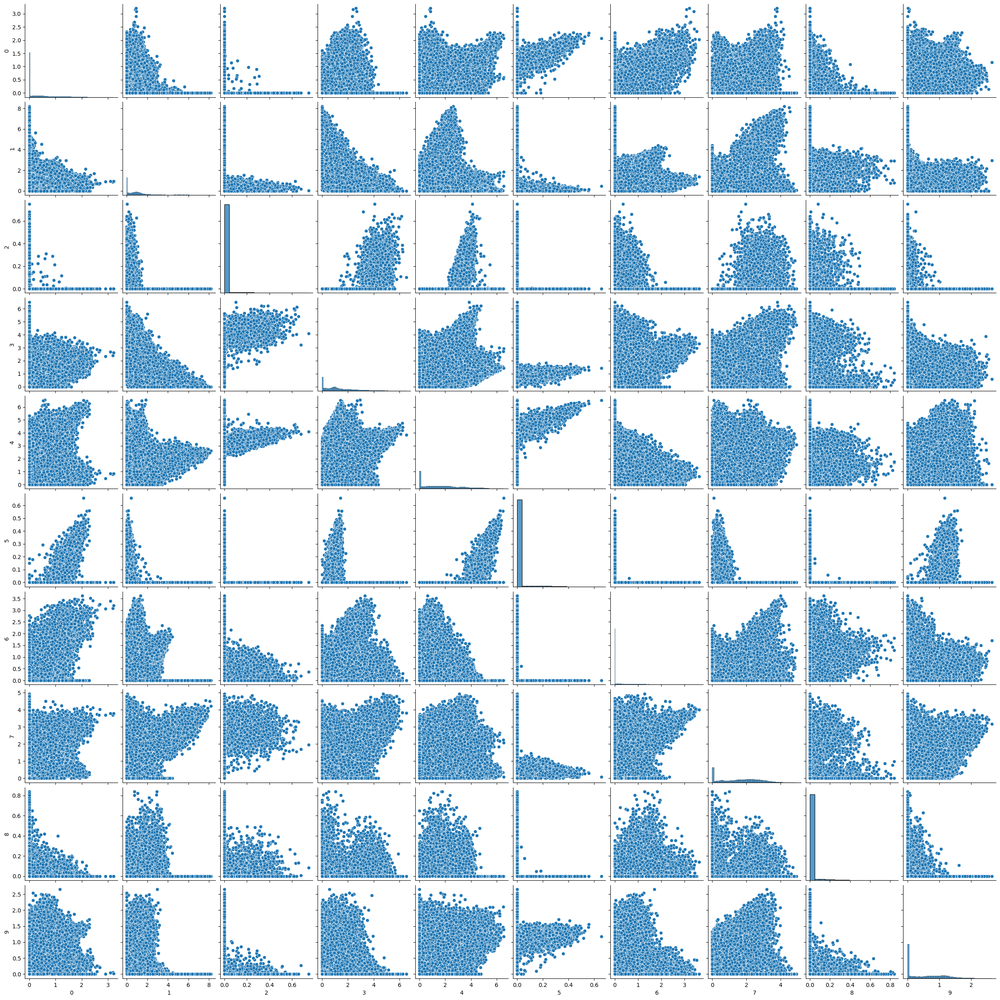

In [15]:
sns.pairplot(X_df.iloc[:,:10])
plt.show()

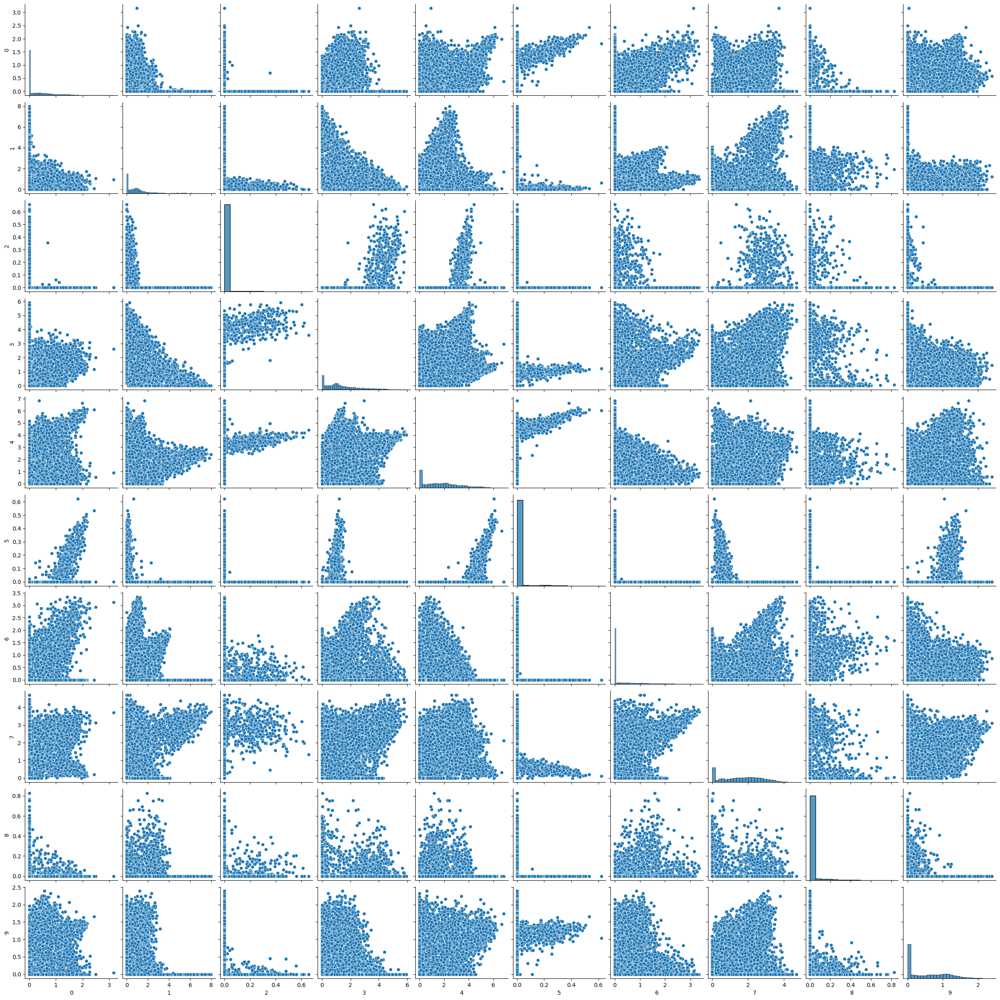

In [16]:
sns.pairplot(X_blind_df.iloc[:,:10])
plt.show()

# Standardize the Data

In [ ]:
def standardise(X):
    # mean and standard deviation of all the features irrespective of class differences
    mean_all   = X.mean()
    std_all    = X.std()

    # standardised values
    X_standardised = (X-mean_all)/std_all
    return X_standardised

# X_standardised = standardise(X_original)
# X_standardised.head(10)

In [9]:
scaler = StandardScaler()
scaler.fit(X_df)
X_standardised = scaler.transform(X_df)
X_blind_standardised = scaler.transform(X_blind_df)

In [26]:
X_standardised[:100, 25].var()

0.0

In [10]:
scaler.mean_.shape, scaler.var_.shape

((100,), (100,))

### Train, Test Split

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(X_standardised, Y, stratify=Y, test_size=0.25, shuffle=True, random_state=2)
print(f"X_train shape: {X_train.shape} \tX_test shape: {X_test.shape} \tY_train shape: {Y_train.shape} \tX_blind_original shape: {X_blind_original.shape}")

# X_train, Y_train = (X_standardised, Y)
# print(f"X_train shape: {X_train.shape} \tY_train shape: {Y_train.shape} \tX_blind_original shape: {X_blind_original.shape}")

X_train shape: (37500, 100) 	X_test shape: (12500, 100) 	Y_train shape: (37500,) 	X_blind_original shape: (10000, 100)


# Convert Numpy array to Pandas DataFrame

In [12]:
X_train = pd.DataFrame(X_train)
# X_test = pd.DataFrame(X_test)

Y_train = pd.DataFrame(Y_train)
# Y_test = pd.DataFrame(Y_test)

X_blind_test = pd.DataFrame(X_blind_standardised)


In [13]:
X_train.head(5)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,2.069044,0.222402,-0.177707,-0.606206,-1.202908,-0.217107,2.311027,1.014067,-0.232932,2.317361,...,1.214978,-0.289548,-1.055115,-0.761522,0.674856,-0.629350,-0.955278,-0.930129,-0.267381,-0.160982
1,0.002352,0.260570,-0.177707,-0.254026,-1.202908,-0.217107,0.845193,0.896561,-0.232932,-0.317107,...,0.535356,0.706132,-1.055115,-0.761522,0.120861,-0.632746,-0.955278,-0.576329,-0.267381,-0.160982
2,-0.732850,-0.143250,-0.177707,0.105016,0.897620,-0.217107,-0.586856,0.896735,-0.232932,1.650732,...,0.501491,-0.599552,-0.220853,-0.761522,-0.221355,-0.632746,-0.381699,-0.408828,-0.267381,-0.160982
3,-0.732850,0.174422,-0.177707,1.252781,-1.202908,-0.217107,-0.586856,-1.462501,-0.232932,-0.979568,...,-0.946782,-0.599552,0.040373,0.996978,0.112295,1.705102,-0.955278,2.776677,1.260830,-0.160982
4,-0.732850,-0.366337,-0.177707,1.175636,-1.202908,-0.217107,-0.586856,-1.462501,-0.232932,-0.621715,...,-1.079826,-0.599552,0.615196,1.715981,0.337519,1.971741,-0.955278,2.579280,-0.267381,-0.160982


In [22]:
X_blind_test.head(5)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.107951,-0.490235,-0.177707,0.543774,0.749415,-0.217107,0.000178,1.189772,-0.232932,1.978734,...,0.350360,0.221455,-0.583492,-0.761522,-0.105237,-0.632746,-0.576038,-0.930129,-0.267381,-0.160982
1,-0.732850,1.525392,-0.177707,-0.433378,-0.561596,-0.217107,-0.586856,1.300713,-0.232932,-0.979568,...,-0.931825,-0.599552,1.801406,1.555415,-0.008247,0.807391,1.559910,0.877377,-0.267381,-0.160982
2,-0.732850,1.439589,-0.177707,0.053548,-0.518495,-0.217107,-0.586856,1.356113,-0.232932,-0.979568,...,-1.053713,-0.599552,1.110163,1.039239,0.054962,0.495750,1.115434,0.800139,-0.267381,-0.160982
3,-0.732850,0.182941,-0.177707,1.617301,1.141724,-0.217107,-0.586856,1.186561,-0.232932,-0.979568,...,-1.079826,-0.599552,-0.664333,-0.761522,0.492419,-0.406047,0.142518,0.522552,-0.267381,-0.160982
4,1.627045,-0.855754,-0.177707,-0.504919,1.766687,-0.217107,-0.586856,-0.801701,-0.232932,1.224866,...,0.042524,-0.599552,0.347139,-0.506527,-1.495489,-0.505715,1.571968,-0.930129,-0.267381,-0.160982


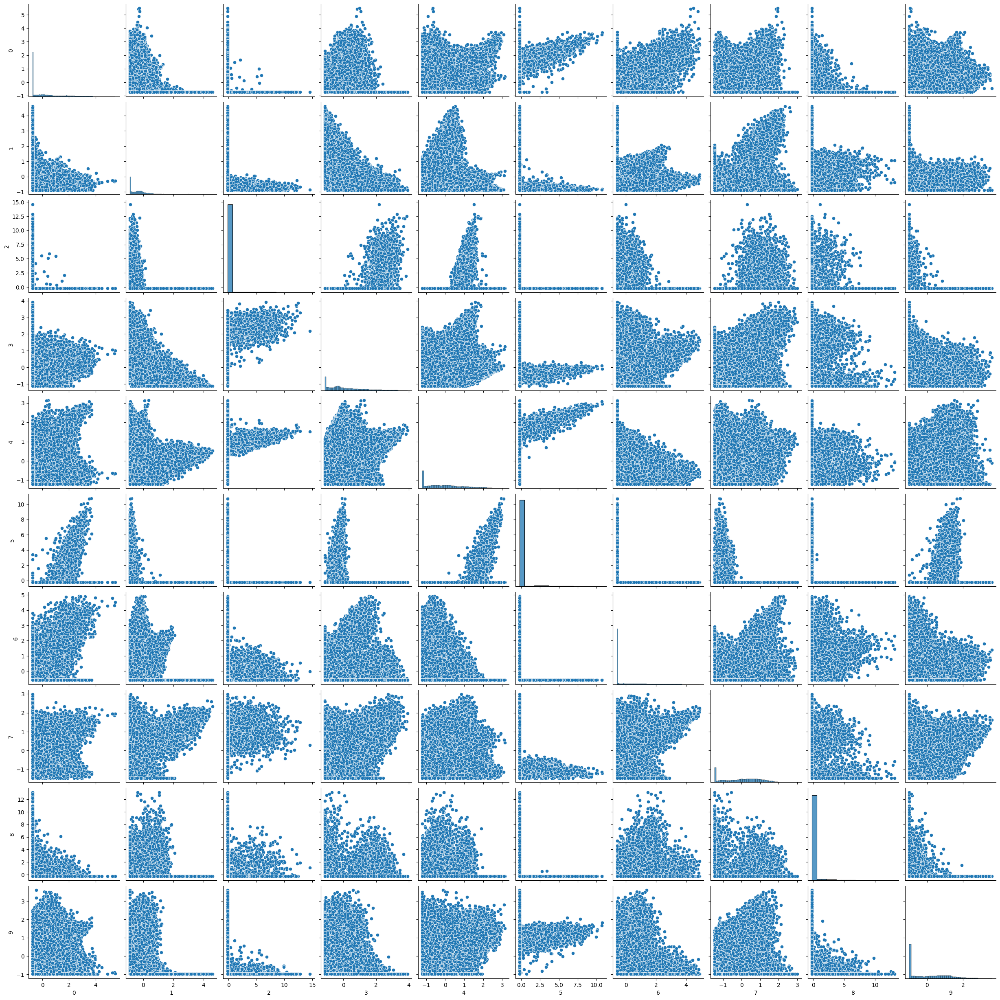

In [23]:
sns.pairplot(X_train.iloc[:,:10])
plt.show()

Notice below how 25 is!

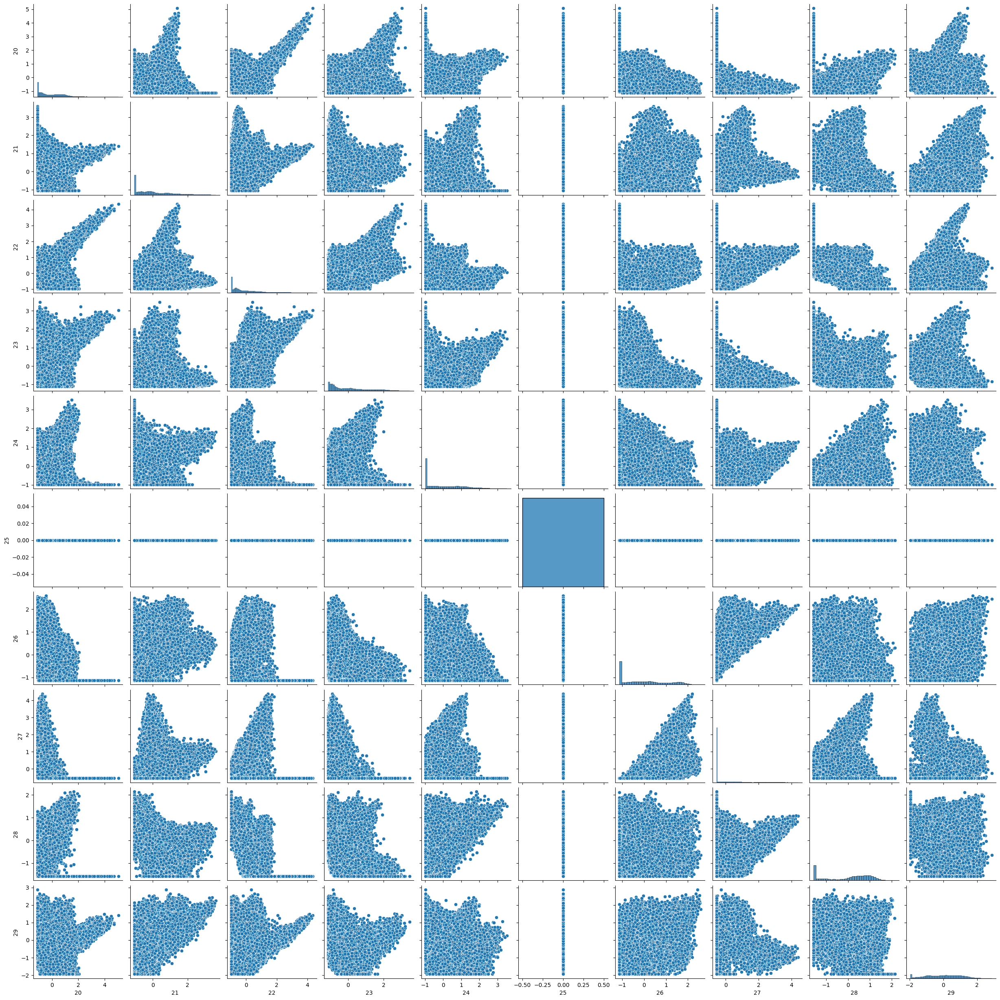

In [16]:
sns.pairplot(X_train.iloc[:,20:30])
plt.show()

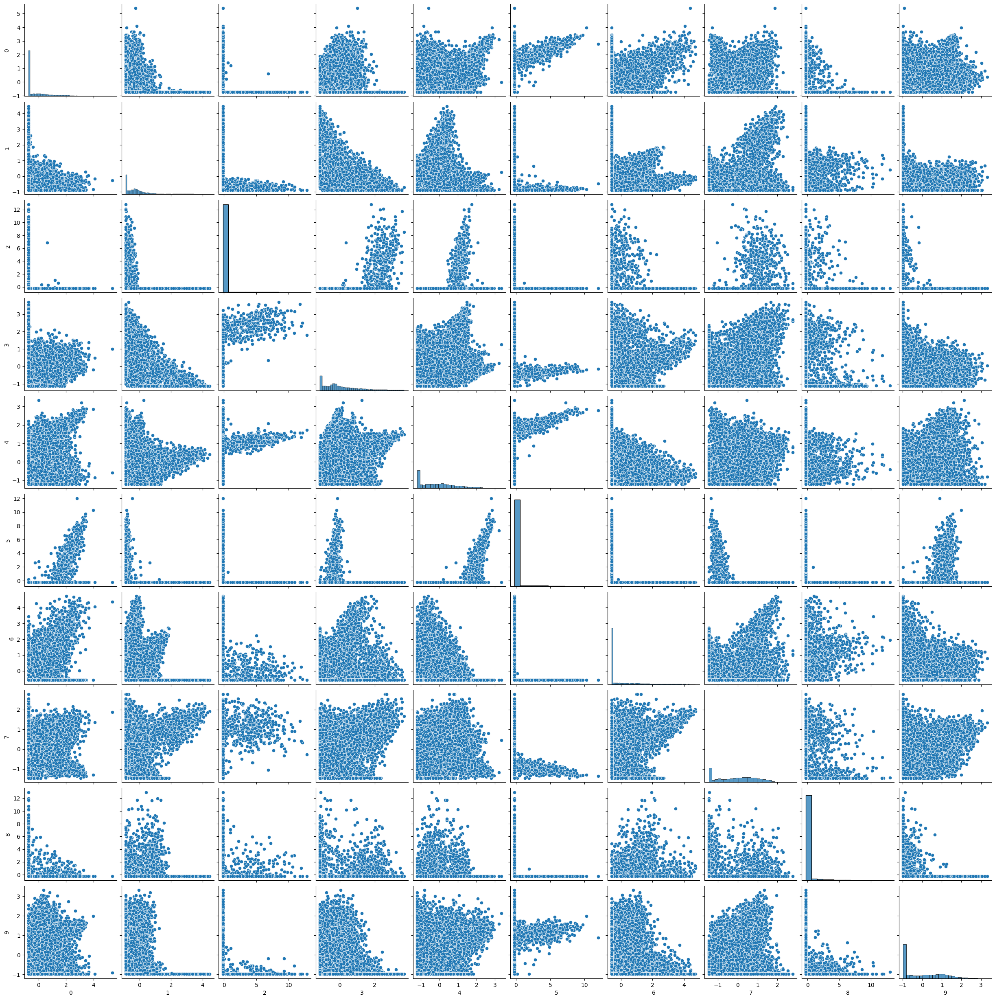

In [24]:
sns.pairplot(X_blind_test.iloc[:,:10])
plt.show()

## Correlation Matrix

In [14]:
start_time = time.time()

corr = X_train.corr()
print("Correlation shape: ", corr.shape)

# sample_size = 10
# corr = X_train.sample(sample_size).corr()

end_time = time.time()
elapsed_time = end_time - start_time
print(f"elapsed time: {elapsed_time}")


Correlation shape:  (100, 100)
elapsed time: 1.2224516868591309


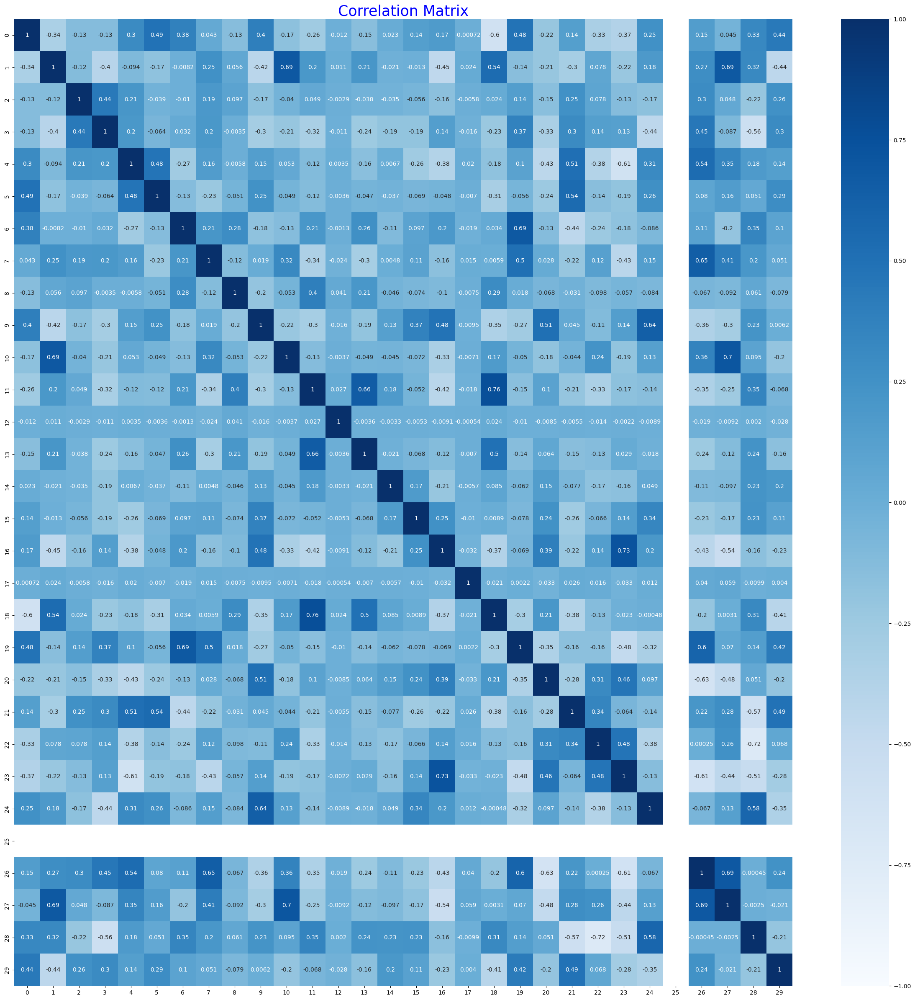

In [15]:
corr_subset = corr.iloc[:30, :30]

ax, fig = plt.subplots(figsize = (30,30))
plt.title("Correlation Matrix", color="blue", fontsize=25)
sns.heatmap(corr_subset, vmin=-1, cmap=plt.cm.Blues, annot=True)
plt.show()

Notice that feature 25 is all zeros that is why we have that white cross because its variance and mean are zeros.

### Plot the Confusion Matrix and print the Classification Report and Accuracy Score

In [27]:
labels = np.unique(Y)
labels = [str(elem) for elem in labels]

def confusion_matrix_score(ytest, ypred, labels=labels):

    score = accuracy_score(ytest, ypred) * 100
    print(f"\n\nThe accuracy score is {score:.2f}%.", end="\n\n")

    conf_matrix = confusion_matrix(ytest, ypred)

    sns.heatmap(conf_matrix, square=True, annot=True, fmt='d', cbar=True, lw=0.6,
                xticklabels=labels,
                yticklabels=labels)

    plt.title("Confusion Matrix", color="blue", fontsize=25)

    plt.xlabel('True Label')
    plt.ylabel('Predicted Label');

    # classification_report
    print(f"classification_report: \n{ classification_report(ytest, ypred, target_names=labels) }", end="\n\n")

## Save and load models

In [28]:
import pickle

def save_model(model_name, fname):
    with open(fname, 'wb') as f:
        pickle.dump(model_name, f)

    print("The model is saved")

def load_model(fname):
    return pickle.load(open(fname,'rb'))



# Train

## Grid Search and Cross-validation for RBF and Sigmoid kernels

In [29]:
param_grid = {'C':[10, 100], 'gamma':['scale', 'auto'], 'kernel':['rbf', 'sigmoid']}
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose=2, cv=3)
grid.fit(X_train, Y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=   4.2s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=   4.1s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=   6.2s
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=   3.8s
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=   2.6s
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=   2.7s
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time=   3.7s
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time=   6.1s
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time=   4.3s
[CV] END ...................C=10, gamma=auto, kernel=sigmoid; total time=   2.6s
[CV] END ...................C=10, gamma=auto, kernel=sigmoid; total time=   2.7s
[CV] END ...................C=10, gamma=auto, ker

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [10, 100], 'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'sigmoid']},
             verbose=2)

Accuracy on Test Set: 0.9868


The accuracy score is 98.68%.

classification_report: 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1250
           1       1.00      0.99      0.99      1250
           2       0.99      0.99      0.99      1250
           3       0.97      0.97      0.97      1250
           4       0.99      0.99      0.99      1250
           5       0.98      0.96      0.97      1250
           6       0.99      1.00      0.99      1250
           7       0.98      0.99      0.99      1250
           8       1.00      1.00      1.00      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.99     12500
   macro avg       0.99      0.99      0.99     12500
weighted avg       0.99      0.99      0.99     12500


Elapsed Time: 6.517286777496338


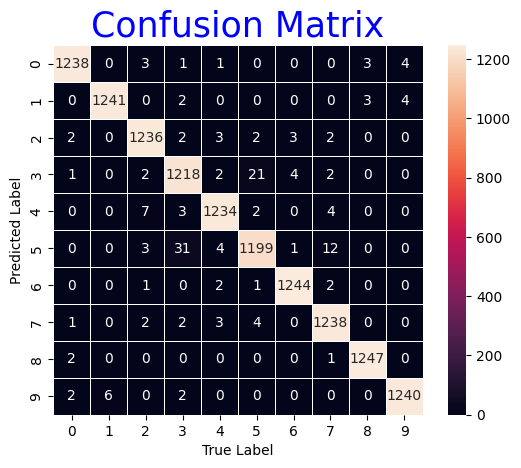

In [31]:
# Get the best model
best_svm_model = grid.best_estimator_


start_time = time.time()

# Evaluate the best model on the test set
accuracy = best_svm_model.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_pred = best_svm_model.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time}")


# You can also access other information, such as the cross-validated results
# cv_results = grid.cv_results_
# print("Cross-validated results:")
# print(cv_results)


In [ ]:
# fname1 = os.path.join(folder_path, "best_model_v1.pkl")
# best_svm_model = load_model(fname1)

In [32]:
# Save the best_model
fname1 = os.path.join(folder_path, "1best_model_v1.pkl")
save_model(model_name=best_svm_model, fname=fname1)

start_time = time.time()

y_pred_svm = best_svm_model.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname3 = os.path.join(folder_path, "1blind_test_v1.pkl")
save_model(model_name=y_pred_svm, fname=fname3)

The model is saved
Elapsed time:  3.733713150024414
The model is saved


In [33]:
df = pd.DataFrame(grid.cv_results_)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,2.389188,0.127660,2.465632,0.818953,10,scale,rbf,"{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}",0.98696,0.98808,0.98864,0.987893,0.000698,1
1,1.643037,0.478650,1.390701,0.039499,10,scale,sigmoid,"{'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}",0.98088,0.97944,0.98096,0.980427,0.000698,6
2,2.296732,0.352073,2.416161,0.719391,10,auto,rbf,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",0.98704,0.98792,0.98856,0.987840,0.000623,2
3,1.307135,0.042573,1.499591,0.235195,10,auto,sigmoid,"{'C': 10, 'gamma': 'auto', 'kernel': 'sigmoid'}",0.98112,0.98032,0.98096,0.980800,0.000346,5
4,2.567083,0.491502,2.343567,0.535950,100,scale,rbf,"{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}",0.98432,0.98616,0.98656,0.985680,0.000975,4
5,1.472019,0.266916,1.319727,0.016653,100,scale,sigmoid,"{'C': 100, 'gamma': 'scale', 'kernel': 'sigmoid'}",0.97768,0.97736,0.97752,0.977520,0.000131,8
6,2.269415,0.234467,2.509901,0.818738,100,auto,rbf,"{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}",0.98440,0.98624,0.98648,0.985707,0.000929,3
7,1.264010,0.219705,1.094763,0.106571,100,auto,sigmoid,"{'C': 100, 'gamma': 'auto', 'kernel': 'sigmoid'}",0.97768,0.97832,0.97752,0.977840,0.000346,7


In [52]:
print(f"grid.best_estimator_: {grid.best_estimator_}, \ngrid.best_params_: {grid.best_params_}, \ngrid.best_score_: {grid.best_score_}")

grid.best_estimator_: SVC(C=10), 
grid.best_params_: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}, 
grid.best_score_: 0.9878933333333334


## Try single models. Note: computationally heavy!



The accuracy score is 75.12%.

classification_report: 
              precision    recall  f1-score   support

           0       0.29      1.00      0.45      1250
           1       1.00      0.76      0.87      1250
           2       0.99      0.65      0.79      1250
           3       0.97      0.71      0.82      1250
           4       1.00      0.76      0.86      1250
           5       0.98      0.66      0.79      1250
           6       1.00      0.78      0.88      1250
           7       0.99      0.67      0.80      1250
           8       1.00      0.73      0.84      1250
           9       1.00      0.79      0.88      1250

    accuracy                           0.75     12500
   macro avg       0.92      0.75      0.80     12500
weighted avg       0.92      0.75      0.80     12500


Elapsed time (sec):  518.0994868278503


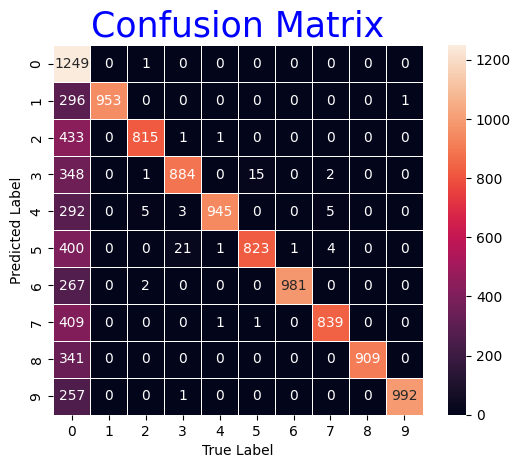

In [35]:
start_time = time.time()

# Train a single SVC model
svc_rdf_c1 = SVC(kernel="rbf", C=1, gamma=1.0 )
svc_rdf_c1.fit(X_train, Y_train)
Y_pred = svc_rdf_c1.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)



The accuracy score is 41.57%.

classification_report: 
              precision    recall  f1-score   support

           0       0.61      0.30      0.40      1250
           1       0.41      0.95      0.58      1250
           2       0.29      0.50      0.36      1250
           3       0.63      0.61      0.62      1250
           4       0.13      0.17      0.14      1250
           5       0.34      0.33      0.33      1250
           6       0.64      0.36      0.46      1250
           7       0.65      0.42      0.51      1250
           8       0.68      0.45      0.54      1250
           9       0.20      0.06      0.09      1250

    accuracy                           0.42     12500
   macro avg       0.46      0.42      0.40     12500
weighted avg       0.46      0.42      0.40     12500


Elapsed time (sec):  153.39914679527283


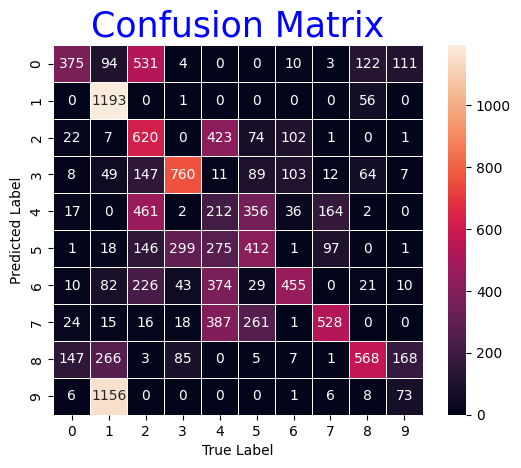

In [36]:
start_time = time.time()

# Train a single SVC model
svc_sig_c1 = SVC(kernel="sigmoid", C=1, gamma=1.0 )
svc_sig_c1.fit(X_train, Y_train)
Y_pred = svc_sig_c1.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)



The accuracy score is 20.66%.

classification_report: 
              precision    recall  f1-score   support

           0       0.11      1.00      0.20      1250
           1       1.00      0.13      0.23      1250
           2       0.98      0.04      0.09      1250
           3       1.00      0.06      0.11      1250
           4       1.00      0.14      0.25      1250
           5       0.99      0.07      0.13      1250
           6       1.00      0.27      0.43      1250
           7       1.00      0.04      0.07      1250
           8       1.00      0.14      0.25      1250
           9       1.00      0.17      0.29      1250

    accuracy                           0.21     12500
   macro avg       0.91      0.21      0.20     12500
weighted avg       0.91      0.21      0.20     12500


Elapsed time (sec):  675.8155992031097


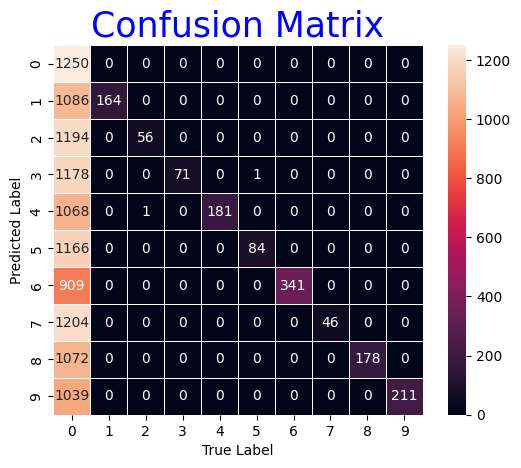

In [37]:
start_time = time.time()

# Train a single SVC model
svc_rdf_c10 = SVC(kernel="rbf", C=10, gamma=10 )
svc_rdf_c10.fit(X_train, Y_train)
Y_pred = svc_rdf_c10.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

### Best Performing Model so far!
svc = SVC(kernel="rbf", C=1, gamma="scale", )



The accuracy score is 98.73%.

classification_report: 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       1.00      0.99      0.99      1250
           2       0.98      0.99      0.99      1250
           3       0.97      0.98      0.97      1250
           4       0.99      0.99      0.99      1250
           5       0.98      0.96      0.97      1250
           6       0.99      0.99      0.99      1250
           7       0.98      0.99      0.99      1250
           8       1.00      1.00      1.00      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.99     12500
   macro avg       0.99      0.99      0.99     12500
weighted avg       0.99      0.99      0.99     12500


Elapsed time (sec):  12.36385703086853


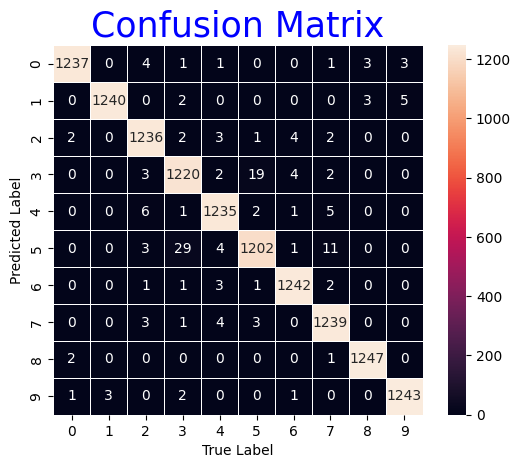

In [38]:
start_time = time.time()

# Train a single SVC model
svc = SVC(kernel="rbf", C=1, gamma="scale", )
svc.fit(X_train, Y_train)
Y_pred = svc.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

Since this is the best performing model so far, let's try Cross-validation with it to ensure that the results are stable and was not just lucky on that particular dataset.

In [39]:
start_time = time.time()

clf = SVC(kernel="rbf", C=1, gamma="scale" )
scores = cross_val_score(clf, X_train, Y_train, cv=5)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

scores

Elapsed time (sec):  35.94395565986633


array([0.98746667, 0.98826667, 0.98853333, 0.9888    , 0.98893333])

The mean score and the standard deviation are hence given by:

In [40]:
print("%0.4f accuracy with a standard deviation of %0.4f" % (scores.mean(), scores.std()))

0.9884 accuracy with a standard deviation of 0.0005


In [59]:
best_model = os.path.join(folder_path, "1best_model.pkl")
save_model(model_name=svc, fname=best_model)

start_time = time.time()

y_pred_best = svc.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

blind_test_best_pkl = os.path.join(folder_path, "1blind_test_best.pkl")
save_model(model_name=y_pred_best, fname=blind_test_best_pkl)

The model is saved
Elapsed time:  4.074476480484009
The model is saved


Save the csv file

In [60]:
blind_test_best_pkl = load_model(blind_test_best_pkl)

In [63]:
blind_test_best = pd.DataFrame(blind_test_best_pkl)

blind_test_best_csv = os.path.join(folder_path, "1blind_test_best.csv")
blind_test_best.to_csv(f'{blind_test_best_csv}')

In [68]:
blind_test_best.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,3,8,8,0,6,6,1,6,3,1,0,9,5,7,9,8,5,7,8,6


## Grid Search and Cross-validation for the Polynomial kernel

Fitting 3 folds for each of 6 candidates, totalling 18 fits
Best Parameters:  {'C': 10, 'degree': 3, 'kernel': 'poly'}
Accuracy on Test Set: 0.9868


The accuracy score is 98.68%.

classification_report: 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1250
           1       1.00      0.99      0.99      1250
           2       0.98      0.99      0.99      1250
           3       0.96      0.97      0.97      1250
           4       0.99      0.99      0.99      1250
           5       0.98      0.96      0.97      1250
           6       0.99      1.00      0.99      1250
           7       0.99      0.99      0.99      1250
           8       1.00      1.00      1.00      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.99     12500
   macro avg       0.99      0.99      0.99     12500
weighted avg       0.99      0.99      0.99     12500


Elapsed time:  166.33037114143372


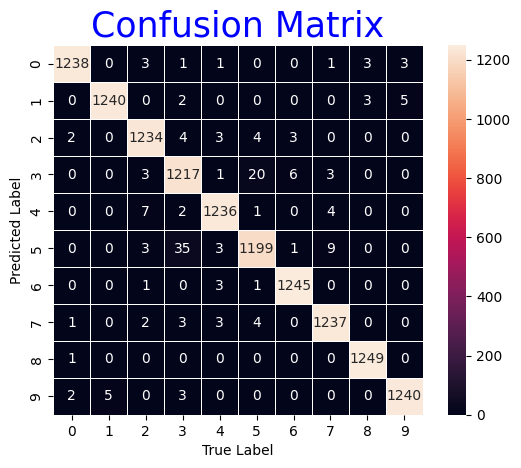

In [42]:
start_time = time.time()

# Define the parameter grid to search
# param_grid = {
#     'C': [0.1, 1, 10],
#     'kernel': ['rbf', 'sigmoid'],
#     'gamma': [1, 0.1, 'scale'],
# }
param_grid = {
    'C':[1, 10],
    'degree':[3, 4, 5],
    'kernel':['poly']
    }

# Create the GridSearchCV object with 3-fold cross-validation
grid_search = GridSearchCV(SVC(), param_grid, cv=3, scoring='accuracy', refit=True, n_jobs=-1, verbose=2)

# Fit the model to the data
grid_search.fit(X_train, Y_train)

# Print the best parameters found by the grid search
print("Best Parameters: ", grid_search.best_params_)

# Get the best model
best_svm_polymodel = grid_search.best_estimator_

# Evaluate the best model on the test set
accuracy = best_svm_polymodel.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_predpoly = best_svm_polymodel.predict(X_test)
confusion_matrix_score(Y_test, Y_predpoly)

# You can also access other information, such as the cross-validated results
cv_results = grid_search.cv_results_
# print("Cross-validated results:")
# print(cv_results)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)


In [43]:
fname2 = os.path.join(folder_path, "1best_model_poly_v1.pkl")
save_model(model_name=best_svm_polymodel, fname=fname2)


The model is saved


In [45]:
#cv_results = grid_search.cv_results_
df = pd.DataFrame(cv_results)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,10.777543,1.576238,3.165872,0.111864,1,3,poly,"{'C': 1, 'degree': 3, 'kernel': 'poly'}",0.98320,0.98632,0.98544,0.984987,0.001313,2
1,18.154834,2.213291,5.243068,0.985892,1,4,poly,"{'C': 1, 'degree': 4, 'kernel': 'poly'}",0.97096,0.97560,0.97248,0.973013,0.001931,5
2,25.012154,1.003986,8.831890,1.550733,1,5,poly,"{'C': 1, 'degree': 5, 'kernel': 'poly'}",0.94736,0.95424,0.95064,0.950747,0.002810,6
3,4.681069,0.836095,2.248015,0.657769,10,3,poly,"{'C': 10, 'degree': 3, 'kernel': 'poly'}",0.98648,0.98856,0.98864,0.987893,0.001000,1
4,7.010328,1.595078,2.436760,0.224644,10,4,poly,"{'C': 10, 'degree': 4, 'kernel': 'poly'}",0.98328,0.98600,0.98536,0.984880,0.001161,3
5,10.850535,1.223429,3.286395,1.354776,10,5,poly,"{'C': 10, 'degree': 5, 'kernel': 'poly'}",0.97304,0.97920,0.97712,0.976453,0.002559,4


In [46]:
print(f"best_svm_polymodel: {best_svm_polymodel}, \ngrid_search.best_params_: {grid_search.best_params_}, \ngrid_search.best_score_: {grid_search.best_score_}")

best_svm_polymodel: SVC(C=10, kernel='poly'), 
grid_search.best_params_: {'C': 10, 'degree': 3, 'kernel': 'poly'}, 
grid_search.best_score_: 0.9878933333333334


In [47]:
start_time = time.time()

y_pred_poly = best_svm_polymodel.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname4 = os.path.join(folder_path, "1blind_test_poly_v1.pkl")
save_model(model_name=y_pred_poly, fname=fname4)


Elapsed time:  1.8984160423278809
The model is saved


---
---
---

# Gaussian Naive Bayes

In [48]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()


Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best Parameters:  {'var_smoothing': 1e-06}
Accuracy on Test Set: 0.9762


The accuracy score is 97.62%.

classification_report: 
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.99      0.99      0.99      1250
           2       0.98      0.98      0.98      1250
           3       0.90      0.99      0.94      1250
           4       0.98      0.98      0.98      1250
           5       0.99      0.89      0.94      1250
           6       1.00      0.98      0.99      1250
           7       0.97      0.99      0.98      1250
           8       0.99      1.00      0.99      1250
           9       0.99      0.98      0.99      1250

    accuracy                           0.98     12500
   macro avg       0.98      0.98      0.98     12500
weighted avg       0.98      0.98      0.98     12500


Elapsed time:  8.837131977081299


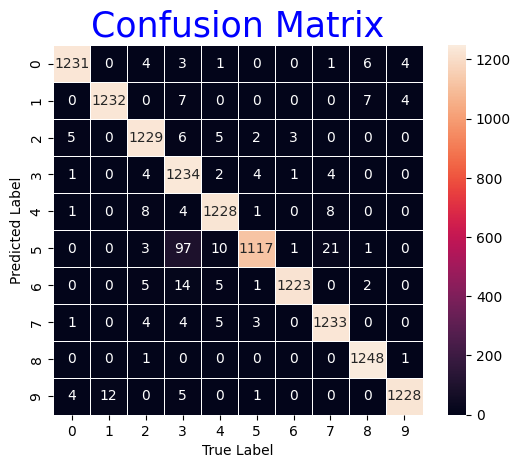

In [49]:
start_time = time.time()

# Define the parameter grid to search
params_gnb = {'var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6]}
# params_gnb = {'var_smoothing': np.logspace(0,-9, num=10)}


# Create the GridSearchCV object with 3-fold cross-validation
grid_search_gnb = GridSearchCV(gnb, params_gnb, cv=10, scoring='accuracy', refit=True, n_jobs=-1, verbose=2)

# Fit the model to the data
grid_search_gnb.fit(X_train, Y_train)

# Print the best parameters found by the grid search
print("Best Parameters: ", grid_search_gnb.best_params_)

# Get the best model
best_gnb_model = grid_search_gnb.best_estimator_

# Evaluate the best model on the test set
accuracy = best_gnb_model.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_pred_gnb = best_gnb_model.predict(X_test)
confusion_matrix_score(Y_test, Y_pred_gnb)

# You can also access other information, such as the cross-validated results
# cv_results = grid_search_gnb.cv_results_
# print("Cross-validated results:")
# print(cv_results)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)


In [50]:
fname_gnb1 = os.path.join(folder_path, "1best_model_gnb_v1.pkl")
save_model(model_name=best_gnb_model, fname=fname_gnb1)


The model is saved


In [51]:
df = pd.DataFrame(cv_results)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,10.777543,1.576238,3.165872,0.111864,1,3,poly,"{'C': 1, 'degree': 3, 'kernel': 'poly'}",0.98320,0.98632,0.98544,0.984987,0.001313,2
1,18.154834,2.213291,5.243068,0.985892,1,4,poly,"{'C': 1, 'degree': 4, 'kernel': 'poly'}",0.97096,0.97560,0.97248,0.973013,0.001931,5
2,25.012154,1.003986,8.831890,1.550733,1,5,poly,"{'C': 1, 'degree': 5, 'kernel': 'poly'}",0.94736,0.95424,0.95064,0.950747,0.002810,6
3,4.681069,0.836095,2.248015,0.657769,10,3,poly,"{'C': 10, 'degree': 3, 'kernel': 'poly'}",0.98648,0.98856,0.98864,0.987893,0.001000,1
4,7.010328,1.595078,2.436760,0.224644,10,4,poly,"{'C': 10, 'degree': 4, 'kernel': 'poly'}",0.98328,0.98600,0.98536,0.984880,0.001161,3
5,10.850535,1.223429,3.286395,1.354776,10,5,poly,"{'C': 10, 'degree': 5, 'kernel': 'poly'}",0.97304,0.97920,0.97712,0.976453,0.002559,4


In [53]:
print(f"best_gnb_model: {best_gnb_model}, \ngrid_search_gnb.best_params_: {grid_search_gnb.best_params_}, \ngrid_search_gnb.best_score_: {grid_search_gnb.best_score_}")

best_gnb_model: GaussianNB(var_smoothing=1e-06), 
grid_search_gnb.best_params_: {'var_smoothing': 1e-06}, 
grid_search_gnb.best_score_: 0.9776000000000001


In [54]:
start_time = time.time()

y_pred_poly = best_gnb_model.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname_gnb2 = os.path.join(folder_path, "1blind_test_gnb_v1.pkl")
save_model(model_name=y_pred_poly, fname=fname_gnb2)

Elapsed time:  0.06229758262634277
The model is saved
